# Level 1

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#pip install folium
import folium

In [2]:
df = pd.read_csv(r"C:\Users\Manikanta\Downloads\Dataset .csv")

In [3]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


## Task 1: Data Exploration and Preprocessing

In [4]:
# Display the number of rows and columns
df.shape

(9551, 21)

In [5]:
#Check for missing values in each column
missing_values = df.isnull().sum()

In [6]:
missing_values

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [7]:
#Drop rows with missing values
df.dropna(inplace=True)

In [9]:
#After handling missing values
df.shape

(9542, 21)

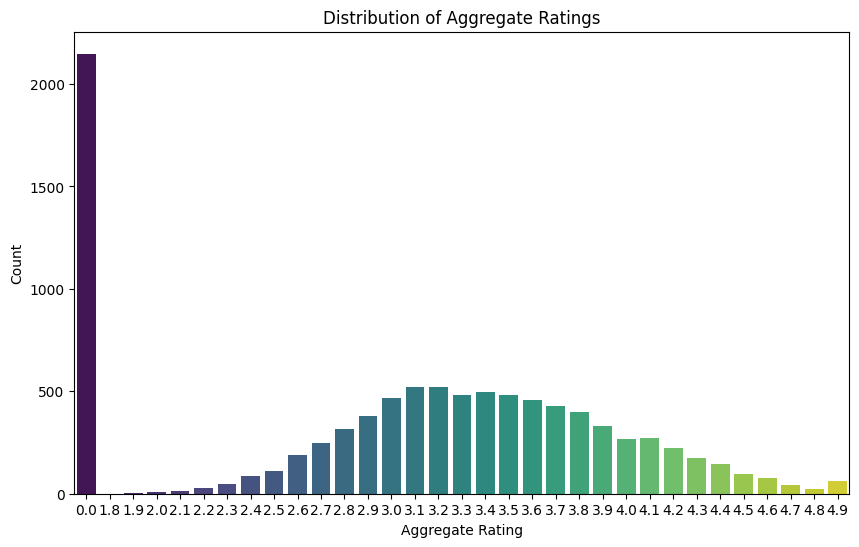

In [12]:
# Analyze the distribution of the target variable
plt.figure(figsize=(10, 6))
sns.countplot(x='Aggregate rating', data=df, palette='viridis')
plt.title('Distribution of Aggregate Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Count')
plt.show()

In [13]:
# Check for class imbalances
rating_counts = df['Aggregate rating'].value_counts()
print("Class Imbalances:")
print(rating_counts)

Class Imbalances:
0.0    2148
3.2     522
3.1     519
3.4     495
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     399
2.9     381
3.9     332
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     143
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      41
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: Aggregate rating, dtype: int64


## Task 2: Descriptive Analysis

In [15]:
# Calculate basic statistical measures
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.542000e+03,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000
mean,9.043301e+06,18.179208,64.274997,25.848532,1200.326137,1.804968,2.665238,156.772060
std,8.791967e+06,56.451600,41.197602,11.010094,16128.743876,0.905563,1.516588,430.203324
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019312e+05,1.000000,77.081565,28.478658,250.000000,1.000000,2.500000,5.000000
50%,6.002726e+06,1.000000,77.192031,28.570444,400.000000,2.000000,3.200000,31.000000
75%,1.835260e+07,1.000000,77.282043,28.642711,700.000000,2.000000,3.700000,130.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


* including count, mean, standard deviation, minimum, maximum, and quartile values (25th, 50th, and 75th percentiles).

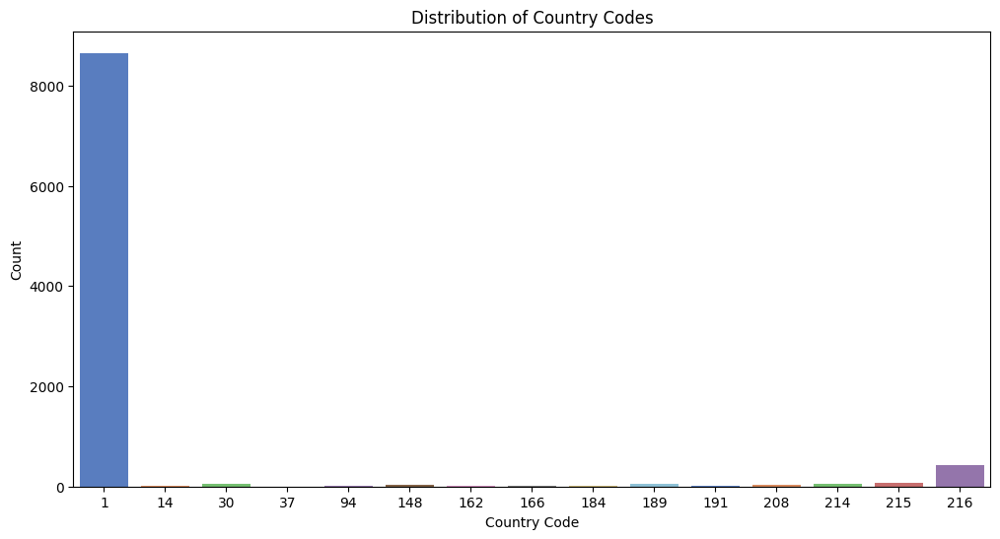

In [18]:
# Explore the distribution of 'Country Code'
plt.figure(figsize=(12, 6))
sns.countplot(x='Country Code', data=df, palette='muted')
plt.title('Distribution of Country Codes')
plt.xlabel('Country Code')
plt.ylabel('Count')
plt.show()

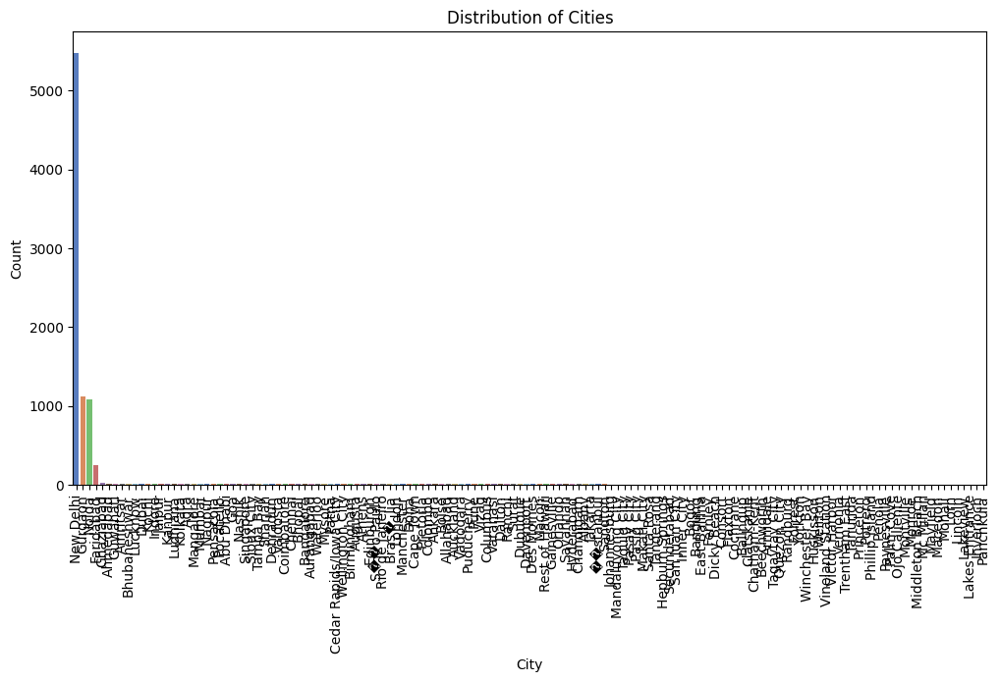

In [19]:
# Explore the distribution of 'City'
plt.figure(figsize=(12, 6))
sns.countplot(x='City', data=df, palette='muted', order=df['City'].value_counts().index)
plt.title('Distribution of Cities')
plt.xlabel('City')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [20]:
# First, split cuisines into individual categories
cuisines = df['Cuisines'].str.split(', ', expand=True).stack().value_counts()

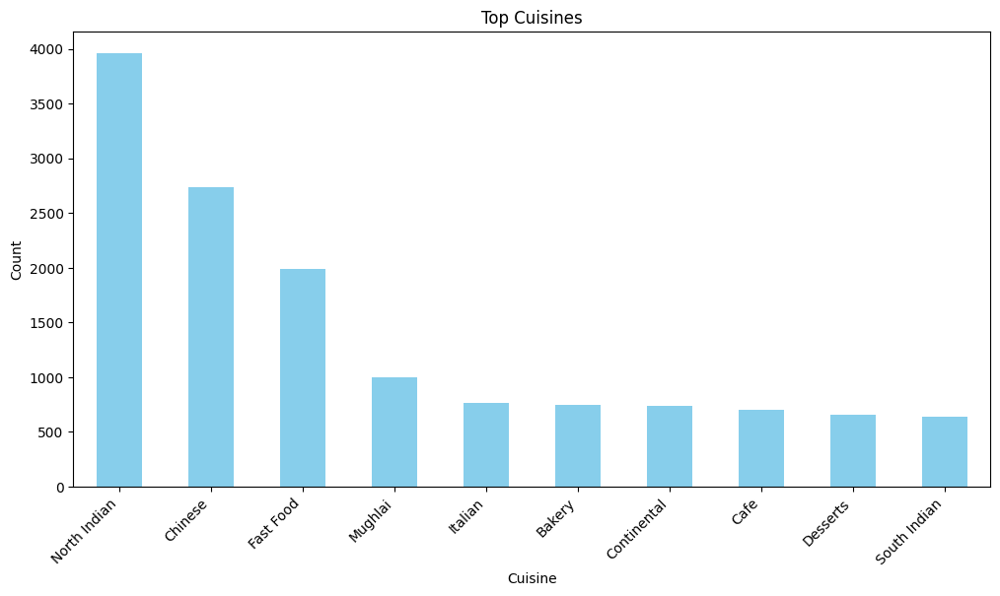

In [21]:
# Plot the top cuisines
top_cuisines = cuisines.head(10)
plt.figure(figsize=(12, 6))
top_cuisines.plot(kind='bar', color='skyblue')
plt.title('Top Cuisines')
plt.xlabel('Cuisine')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

In [22]:
# Identify the top cities with the highest number of restaurants
top_cities = df['City'].value_counts().head(10)
print("Top Cities with the Highest Number of Restaurants:")
print(top_cities)

Top Cities with the Highest Number of Restaurants:
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Ahmedabad         21
Guwahati          21
Amritsar          21
Bhubaneshwar      21
Lucknow           21
Name: City, dtype: int64


## Task 3: Geospatial Analysis

In [27]:
# Create a map centered around the mean latitude and longitude of the dataset
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=10)

In [28]:
# Add markers for each restaurant location
for index, row in df.iterrows():
    folium.Marker(location=[row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(restaurant_map)

In [29]:
# Save the map to an HTML file
restaurant_map.save('restaurant_locations.html')

In [30]:
restaurant_map

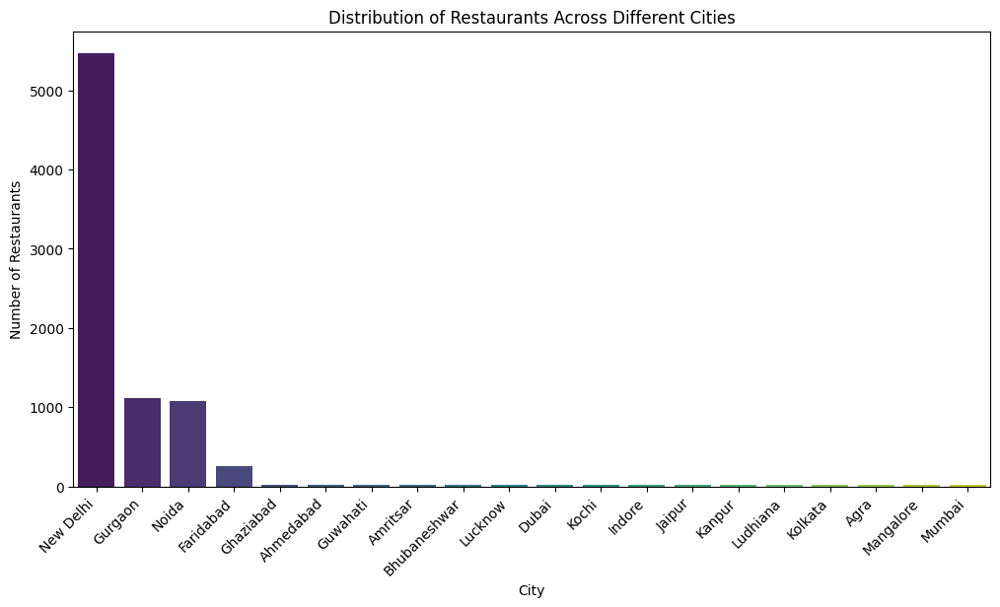

In [31]:
# Analyze the distribution of restaurants across different cities
plt.figure(figsize=(12, 6))
city_distribution = df['City'].value_counts().head(20)
sns.barplot(x=city_distribution.index, y=city_distribution.values, palette='viridis')
plt.title('Distribution of Restaurants Across Different Cities')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45, ha='right')
plt.show()

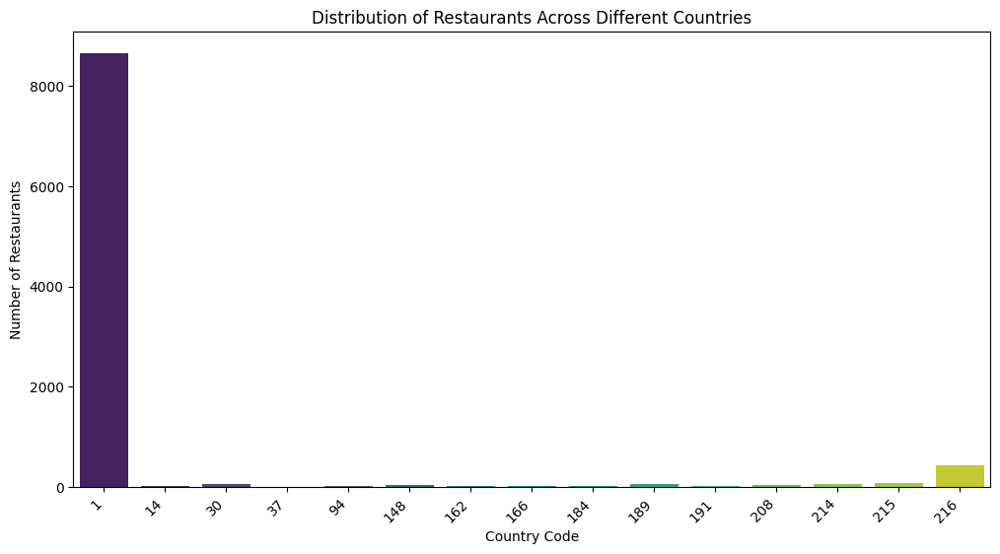

In [32]:
# Analyze the distribution of restaurants across different countries
plt.figure(figsize=(12, 6))
country_distribution = df['Country Code'].value_counts().head(20)
sns.barplot(x=country_distribution.index, y=country_distribution.values, palette='viridis')
plt.title('Distribution of Restaurants Across Different Countries')
plt.xlabel('Country Code')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45, ha='right')
plt.show()

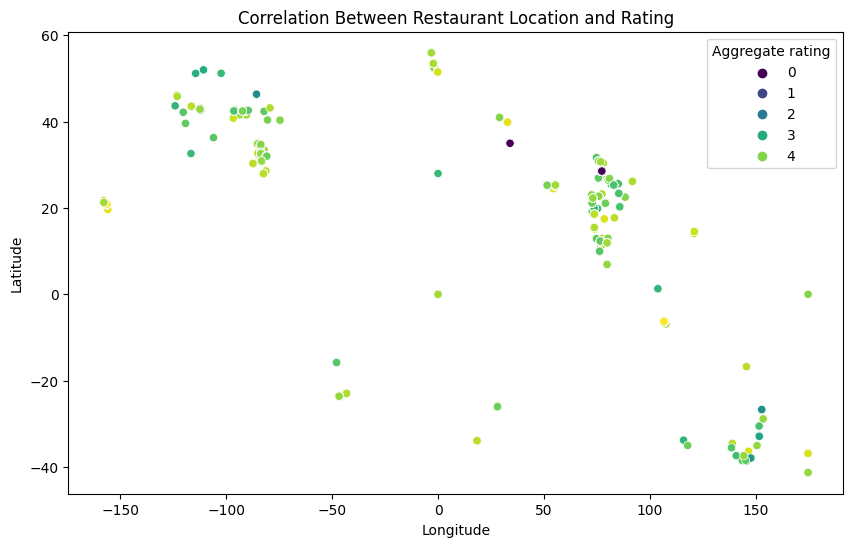

In [33]:
# Determine correlation between restaurant location and rating
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Longitude', y='Latitude', hue='Aggregate rating', data=df, palette='viridis')
plt.title('Correlation Between Restaurant Location and Rating')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()